# Рынок заведений общественного питания Москвы

**Цель исследования:**

- подготовить исследование рынка общественного питания Москвы
- помочь заказчику определиться куда вложить инвестиции


**Ход исследования**

/datasets/moscow_places.csv - датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года.

Проанализируем данные

Детализируем исследование: открытие кофейни

## Предобработка данных.

### Загрузим данные и выполним предобработку.

In [1]:
import pandas as pd
from folium import Map, Marker
from folium.plugins import MarkerCluster
from folium import Map, Choropleth
import json
import seaborn as sns
import matplotlib.pyplot as plt
from plotly import graph_objects as go
import plotly.express as px

In [2]:
# скачаем датафрейм
try:
    df= pd.read_csv('/datasets/moscow_places.csv')
except:
    df= pd.read_csv('/datasets/moscow_places.csv')

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [4]:
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [5]:
 # найдем пропуски в данных
df.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

*Коментарий*

Пропущеные значения наблюдаем в столбцах  hours, price, avg_bill, middle_avg_bill, middle_coffee_cup, seats. Не будем заполнять пропущенные значения, оставляем как есть. 

In [6]:
# найдем количество заведений
df['name'].count() 

8406

In [7]:
# найдем количество уникальных заведений
df['name'].nunique() 

5614

In [8]:
# найдем дубликаты в датафрейме
df.duplicated().sum()

0

In [9]:
df[df.duplicated(['name', 'address'])]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


*Комментарий*

Всего в данных 8 406 заведений, 5614 из них уникальные. Дубликатов не обнаружила.

### Создадим столбец street с названиями улиц из столбца с адресом. 

In [10]:
# создадим столбец street 
df['street'] = df['address'].apply(lambda x: x.split(sep=', ')[1])

In [11]:
df['street']

0                 улица Дыбенко
1                 улица Дыбенко
2            Клязьминская улица
3       улица Маршала Федоренко
4           Правобережная улица
                 ...           
8401          Профсоюзная улица
8402      Пролетарский проспект
8403           Люблинская улица
8404           Люблинская улица
8405        Россошанский проезд
Name: street, Length: 8406, dtype: object

### Создадим столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7).

In [12]:
# создадим столбец is_24/7
df['is_24/7'] = df['hours'].str.contains('ежедневно', na=False, regex=True)\
& df['hours'].str.contains('круглосуточно', na=False, regex=True)

In [13]:
df['is_24/7'].value_counts()

False    7676
True      730
Name: is_24/7, dtype: int64

## Анализ данных.

### Исследуем количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее.

In [14]:
print('Количество категорий заведений в Москве - {},'.format(df['category'].nunique()),'категории:',\
      '; '.join(df['category'].unique()))

Количество категорий заведений в Москве - 8, категории: кафе; ресторан; кофейня; пиццерия; бар,паб; быстрое питание; булочная; столовая


In [15]:
category_cnt = df.pivot_table(index = 'category', values = 'address', aggfunc = 'count')\
.sort_values(by='address', ascending=False)
category_cnt.columns = ['count']

In [16]:
# построим распределение количества заведений по категориям
fig = go.Figure(data=[go.Bar(x = category_cnt.index, y = category_cnt['count'])])
fig.update_layout(
                  title="Распределение количества заведений по категориям",
                  xaxis_title="Категории заведений",
                  yaxis_title="Колличество заведений",
                  height=400,
                  width=1000)
fig.show()

*Комментарий*

Всего представленно 8 категорий заведений.
Кафе - 2378, ресторанов - 2043, кофейни - 1413, бары и пабы - 765, пиццерии - 633, быстрое питание - 603, столовые - 315, булочные - 256. Явные лидеры по количеству заведений в Москве: кафе, рестораны и кофейни.

###  Исследуем количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. 

In [17]:
# создадим  таблицу 
seats_cnt = df.pivot_table(index = 'category', values = 'seats', aggfunc = ['mean', 'median']).reset_index()

In [18]:
# переименуем
seats_cnt.columns = ['category', 'seats_mean', 'seats_median']

In [19]:
seats_cnt.sort_values(by = 'seats_mean', ascending =False)

,category,seats_mean,seats_median
0,"бар,паб",124.532051,82.5
6,ресторан,121.944094,86.0
4,кофейня,111.199734,80.0
7,столовая,99.750000,75.5
2,быстрое питание,98.891117,65.0
3,кафе,97.512315,60.0
5,пиццерия,94.496487,55.0
1,булочная,89.385135,50.0


*Комментарий*

Вывела дынные по посадочным местам, среднее значение и медиана различаются. 

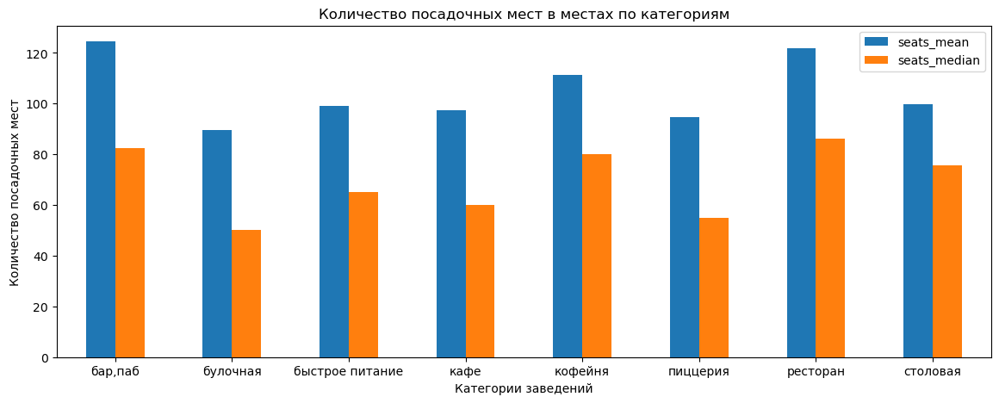

In [20]:
# построим визуализацию количества посадочных мест по категориям
seats_cnt.plot(y=['seats_mean', 'seats_median'], x='category', kind= 'bar', figsize = (14,5))
plt.xlabel('Категории заведений')
plt.ylabel('Количество посадочных мест')
plt.title('Количество посадочных мест в местах по категориям')
plt.xticks(rotation=0)
plt.show();

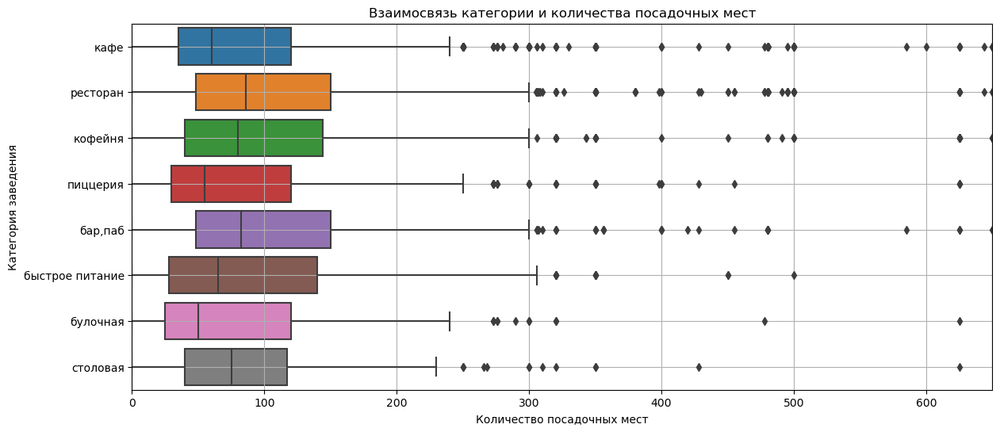

In [21]:
# посмотрим взаимосвязь категории заведения и количества посадочных мест
plt.figure(figsize=(14, 6))
sns.boxplot(x='seats', y='category', data=df) 
plt.xlabel('Количество посадочных мест')
plt.ylabel('Категория заведения')
plt.xlim(0, 650)
plt.grid()
plt.title('Взаимосвязь категории и количества посадочных мест')
plt.show()

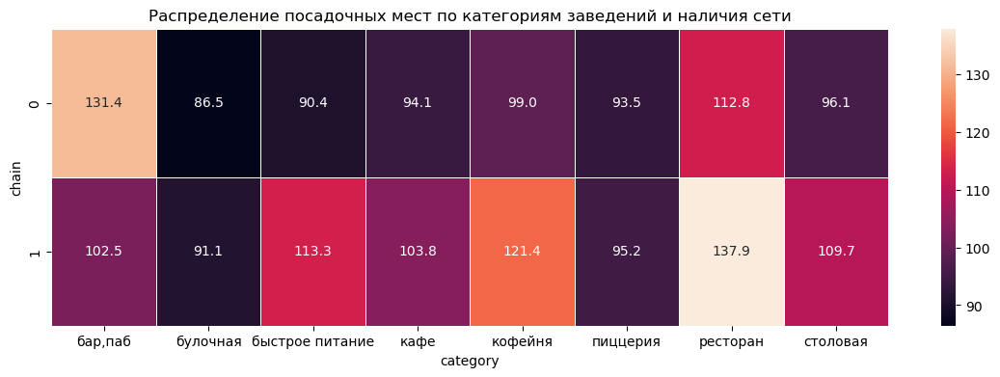

In [22]:
# посмотрим влияет ли на посадочные места сетевое заведение или нет
chain_seats = df.pivot_table(index='chain', columns='category', values='seats', aggfunc='mean')
plt.figure(figsize=(14,4))
plt.title("Распределение посадочных мест по категориям заведений и наличия сети")
sns.heatmap(chain_seats, annot=True, linewidth=.5, fmt = ".1f")
plt.show()

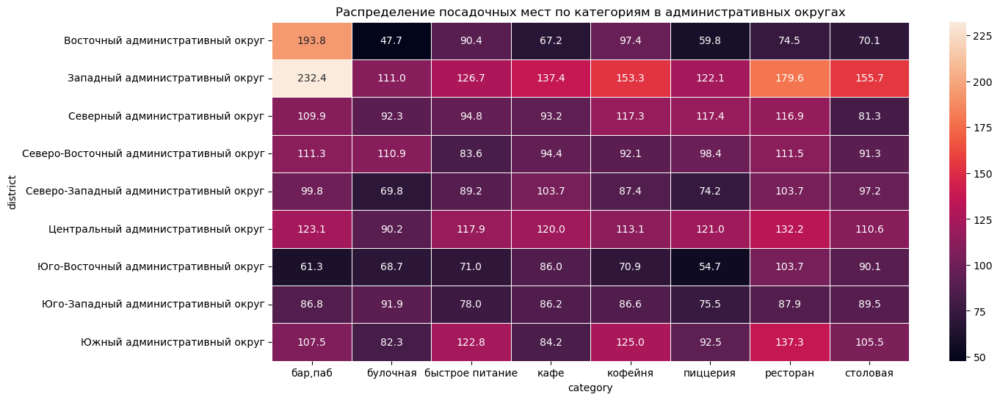

In [23]:
# посмотрим влияет ли на посадочные места расположение
district_seats = df.pivot_table(index='district', columns='category', values='seats', aggfunc='mean')
plt.figure(figsize=(14,6))
plt.title("Распределение посадочных мест по категориям в административных округах")
sns.heatmap(district_seats, annot=True, linewidth=.5, fmt = ".1f")
plt.show()

*Комментарий*

Среднее количество посадочных мест по категориям сильно разнится с медианным. Видим, что на это влияет принадлежность заведения к сети и в каких округах они размещаются.
Наибольшее количество посадочных мест в Западном, Центральном, Южном округе. В Восточном округе только у категории бар/паб есть потребрость в большом количестве мест.  


### Рассмотрим и изобразим соотношение сетевых и несетевых заведений в датасете.

Обозначение:

0 — заведение не является сетевым

1 — заведение является сетевым

In [24]:
# создадим  таблицу 
chain_cnt = df['chain'].value_counts().reset_index()

In [25]:
# переименуем столбы
chain_cnt.columns = ['chain', 'count']

In [26]:
chain_cnt

,chain,count
0,0,5201
1,1,3205


In [27]:
# построим визуализацию количества сетевых и не сетевых заведений
fig = go.Figure(data=[go.Bar(x = chain_cnt.index, y = chain_cnt['count'])])
fig.update_layout(
                  title="Соотношение сетевых и несетевых заведений",
                  xaxis_title="Не сетевое и сетевое заведение",
                  yaxis_title="Колличество заведений",
                  height=400,
                  width=500)
fig.show()

In [28]:
# построим соотношение сетевых и не сетевых заведений
fig = go.Figure()
fig.add_trace(go.Pie(values=chain_cnt['count'], labels=chain_cnt.index, hole=0.9))
fig.update_layout(autosize=False,
    width=900,
    height=400,
    title='Соотношение сетевых и несетевых заведений')  
fig.show()

*Комментарий* 

В датасете преобладают несетевые заведения. 

### Исследуем какие категории заведений чаще являются сетевыми.

In [29]:
# создадим таблицу
category_chain = df[df['chain'] == 1].pivot_table(index = 'category', values = 'chain', aggfunc = 'count').reset_index()

In [30]:
category_chain.sort_values(by = 'chain', ascending=False)

,category,chain
3,кафе,779
6,ресторан,730
4,кофейня,720
5,пиццерия,330
2,быстрое питание,232
0,"бар,паб",169
1,булочная,157
7,столовая,88


In [31]:
# постоим график какие категории чаще являются сетевыми
fig = go.Figure(data=[go.Bar(x = category_chain['category'], y = category_chain['chain'])])
fig.update_layout(
                  title="Сетевые заведения",
                  xaxis_title="Категория заведений",
                  yaxis_title="Колличество заведений",
                  height=400,
                  width=1000)
fig.show()

In [32]:
# посмотрим соотношение сетевых заведений
fig = go.Figure()
fig.add_trace(go.Pie(values=category_chain['chain'], labels=category_chain.index, hole=0.9))
fig.update_layout(autosize=False,
    width=900,
    height=400,
    title='Соотношение сетевых заведений')  
fig.show()

In [33]:
# создадим таблицу
chain = df.pivot_table(index='category', columns='chain', values='name', aggfunc='count').reset_index()

In [34]:
chain.columns = ['category','chain_0', 'chain_1']

In [35]:
# посмотрим соотношение сетевых заведений по категориям
fig = px.histogram(chain, x="category", y=['chain_0', 'chain_1'], histfunc="avg", nbins=8)
fig.update_layout(
                  title="Соотношение сетевых и не сетевых заведений",
                  xaxis_title="Категория заведений",
                  yaxis_title="Колличество заведений")
fig.show()

*Комментарий*

Чаще являются сетевыми кафе, рестораны и кофейни. Там где не нужна идивидуальнотсть, а нужна эффективность (через стандартизацию) там больше сетей. 

### Сгруппируем данные по названиям заведений и найдём топ-15 популярных сетей в Москве. 

In [36]:
# посмотрим топ-15 популярных заведений
name_group = pd.DataFrame(df[df['chain'] == 1].groupby('name').count().sort_values(by='category', ascending=False).head(15)['category'])
name_group.columns= ['values']


fig = go.Figure(data=[go.Pie(labels=name_group.index, values=name_group['values'], pull=[0.2], hole=0.9)])
fig.update_layout(title='Топ-15 сетевых заведений')          
fig.show() 

In [37]:
top15 = pd.DataFrame(df[df['chain'] == 1].groupby('name').count().sort_values(by='category', ascending=False).head(15)['category']).index

In [38]:
pd.DataFrame(df[df['chain'] == 1].query('name in @top15').groupby('name')['category'].unique())

,category
name,
CofeFest,"[кофейня, кафе]"
Cofix,[кофейня]
One Price Coffee,[кофейня]
Prime,"[ресторан, кафе]"
Буханка,"[булочная, кофейня, кафе]"
Додо Пицца,[пиццерия]
Домино'с Пицца,[пиццерия]
КОФЕПОРТ,[кофейня]
Кулинарная лавка братьев Караваевых,[кафе]


*Комментарий*

В топ-15 популярных сетей входят довольно известные и находящие на слуху сети, лидирует Шоколадница. В основном они относятся к категории кафе, кофейни, пиццерия, ресторан и быстрое питание. В большинство этих заведений посетители приходят на бизнес-ланчи или можно быстро взять на вынос кофе и что-то перекусить. Ориентированны на невысокий средний чек и большую проходимость. 

Появление Яндекс.Лавки очень странное.

### Рассмотрим какие административные округа Москвы присутствуют в датасете. 

In [39]:
print('Административные округа:', ', '.join(df['district'].unique()))

Административные округа: Северный административный округ, Северо-Восточный административный округ, Северо-Западный административный округ, Западный административный округ, Центральный административный округ, Восточный административный округ, Юго-Восточный административный округ, Южный административный округ, Юго-Западный административный округ


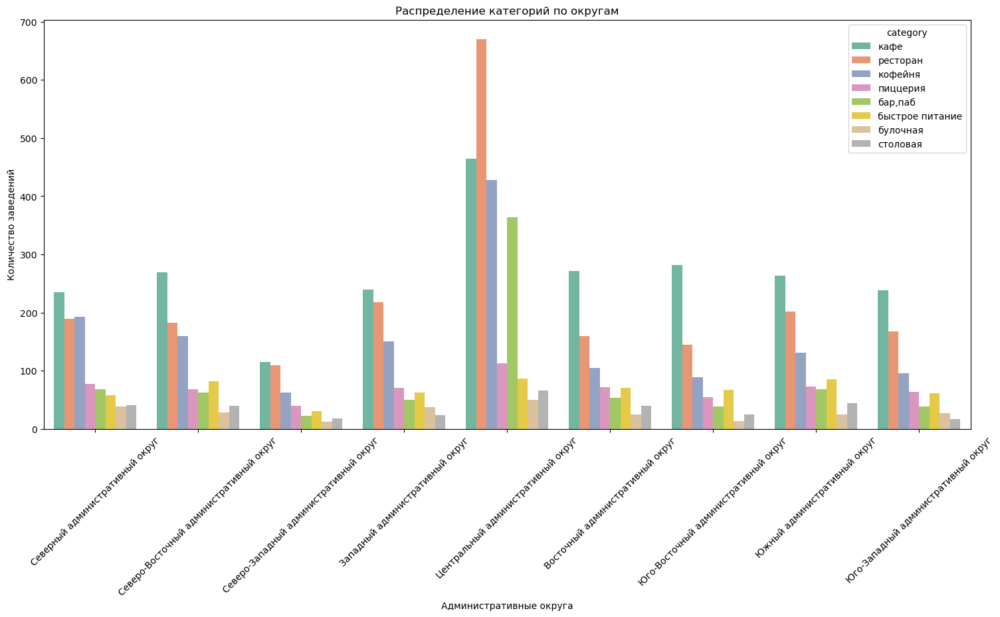

In [40]:
# отобразим количество заведений в каждой категории по округам
sns.set_palette('Set2')
plt.figure(figsize=(18, 8))
sns.countplot(x='district', hue='category', data=df)
plt.title('Распределение категорий по округам')
plt.xlabel('Административные округа')
plt.ylabel('Количество заведений')
plt.xticks(rotation=45)
plt.show()

*Комментарий*

Центральный округ является лидирующим по количеству ресторанов, кафе, кофейнь, баров и пабов. Центральный округ сосредоточие максимального количества заведений разных категорий. Так как центральный округ это территория, где находится большое количество гос.учереждений, бизнесс-центров, коммерческих офисов. И в рабочее время необходимы заведения, где сотрудниких этих организаций проводят свое свободное время, посещая заведения с утра, заходя на ланч или после работы. А так же в выходные центр наполяется жителями города или гостями.

Меньшевсего заведений всех категорий представлены в Северо-Восточном округе.

### Визуализируем распределение средних рейтингов по категориям заведений. 

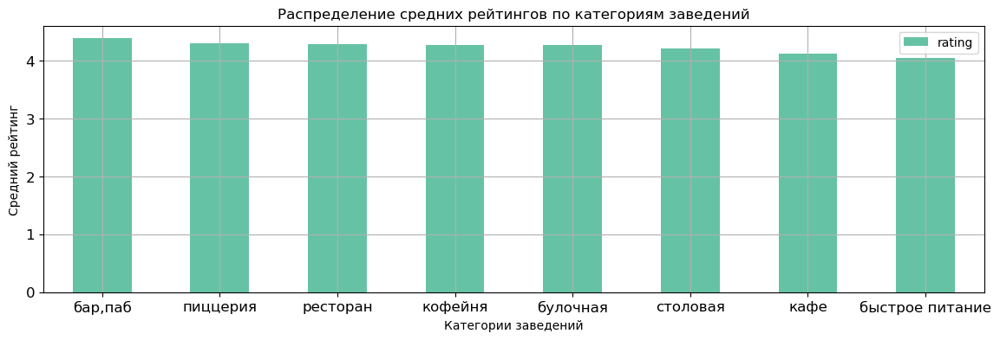

In [41]:
# посмотрим распределение средних рейтингов по категориям заведений
rating = df.pivot_table(index='category', values='rating', aggfunc='mean').sort_values(by='rating', ascending=False)\
.plot(kind= 'bar', figsize = (14,4), grid=True, fontsize=12)
plt.title("Распределение средних рейтингов по категориям заведений")
plt.xlabel('Категории заведений')
plt.ylabel('Средний рейтинг')
plt.xticks(rotation=0)
plt.show()

*Комментарий*

Средний рейтинг заведений по категориям не сильно отличается друг от друга. Лидирует  категория бар и паб, наименьший рейтинг у категриии быстрое питание.

### Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. 

In [42]:
# создадим таблицу
district_rating = df.pivot_table(index='district', values='rating', aggfunc='mean')\
.sort_values(by='rating', ascending=False).reset_index()

In [43]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/data-analyst/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

In [44]:
# создаём карту Москвы
msc = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

In [45]:
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=district_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='RdPu',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по административным округам',
).add_to(msc)

# выводим карту
msc

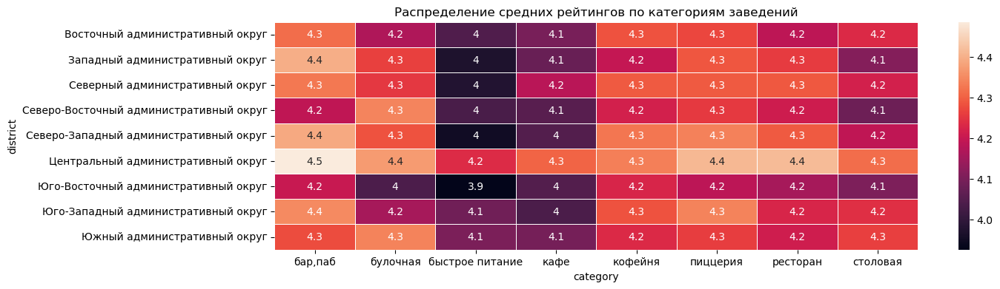

In [46]:
# построем тепловую карту по окгугам Москвы
rating = df.pivot_table(index='district', columns='category', values='rating', aggfunc='mean')
plt.figure(figsize=(14,4))
plt.title("Распределение средних рейтингов по категориям заведений")
sns.heatmap(rating, annot=True, linewidth=.5)
plt.show()

*Комментарий*

По хороплету видим, что наилучший рейтинг у заведений находящихся в Центральном округе. Самый низкий рейтинг в Юго-Восточной округе.

### Отобразим все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

In [47]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
msc = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(msc)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
msc

### Найдём топ-15 улиц по количеству заведений. 

In [48]:
# создадим таблицу
top_str = df.pivot_table(index='street', values='name', aggfunc = 'count').sort_values(by='name', ascending=False).head(15)
top_str

,name
street,
проспект Мира,184
Профсоюзная улица,122
проспект Вернадского,108
Ленинский проспект,107
Ленинградский проспект,95
Дмитровское шоссе,88
Каширское шоссе,77
Варшавское шоссе,76
Ленинградское шоссе,70


In [49]:
top_str_15 = top_str.index

In [50]:
top_str = df.query('street in @top_str_15')

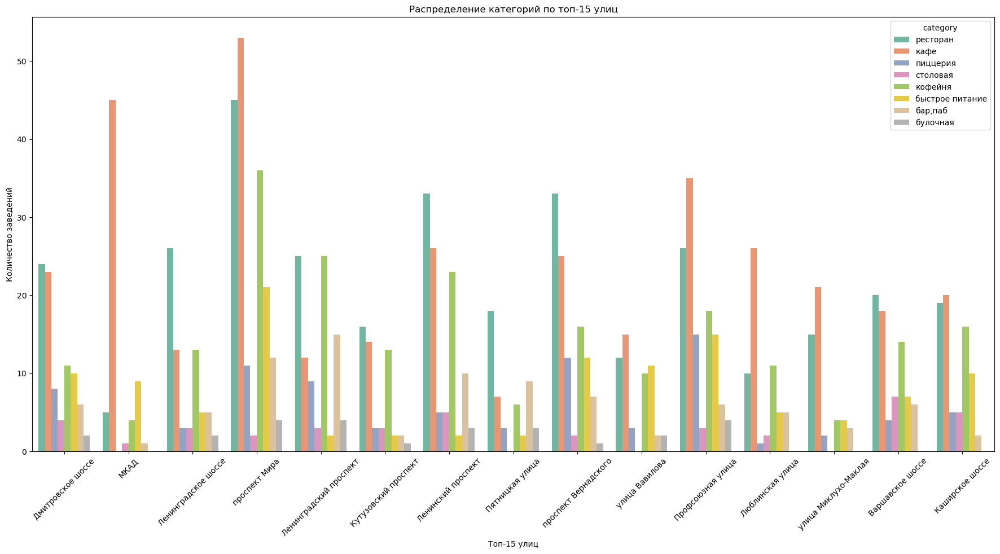

In [51]:
# отобразим распределение категорий по топ-15 улиц
sns.set_palette('Set2')
plt.figure(figsize=(22, 10))
sns.countplot(data =top_str,  x='street', hue='category')
plt.title('Распределение категорий по топ-15 улиц')
plt.xlabel('Топ-15 улиц')
plt.ylabel('Количество заведений')
plt.xticks(rotation=45)
plt.show()

*Комментарий*

Больше всего заведений на улице Проспект Мира, Профсоюзная, проспект Вернадского и Ленинском проспекте.

Большинство ресторанов расположены: проспект Мира, Ленинский проспект, проспект Вернадского, Профсоюзная улица и Ленинградское шоссе.

Кафе: проспект Мира, МКАД, Профсоюзная улица, Ленинский проспект, Люблинская улица.

Кофейни: проспект Мира, Ленинградский проспект и ленинский проспект. 

Обратим внимание, что дело в длине этих улиц, часть из них выдают такое большое число заведений именно за счёт длины.

### Найдём улицы, на которых находится только один объект общепита. 

In [52]:
# создадим таблицу
str_one = df.pivot_table(index= 'street', values='name', aggfunc = 'count').sort_values(by='name')

In [53]:
str_one.columns = ['count']
str_one = str_one[str_one['count'] == 1]

In [54]:
str_one.shape[0]

458

In [55]:
str_one_cnt = str_one.index
str_one_cnt = df.query('street in @str_one_cnt')

Посмотрим, где находятся эти заведения

In [56]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
msc = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(msc)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
str_one_cnt.apply(create_clusters, axis=1)

# выводим карту
msc

*Комментарий*
    
Вероятно, что причина появления таких улиц в центре и дальше от него отличаются - в ЦАО это из-за того, что физически маленькие пешеходные улочки, а ближе к окраинам - удаленность от центра.

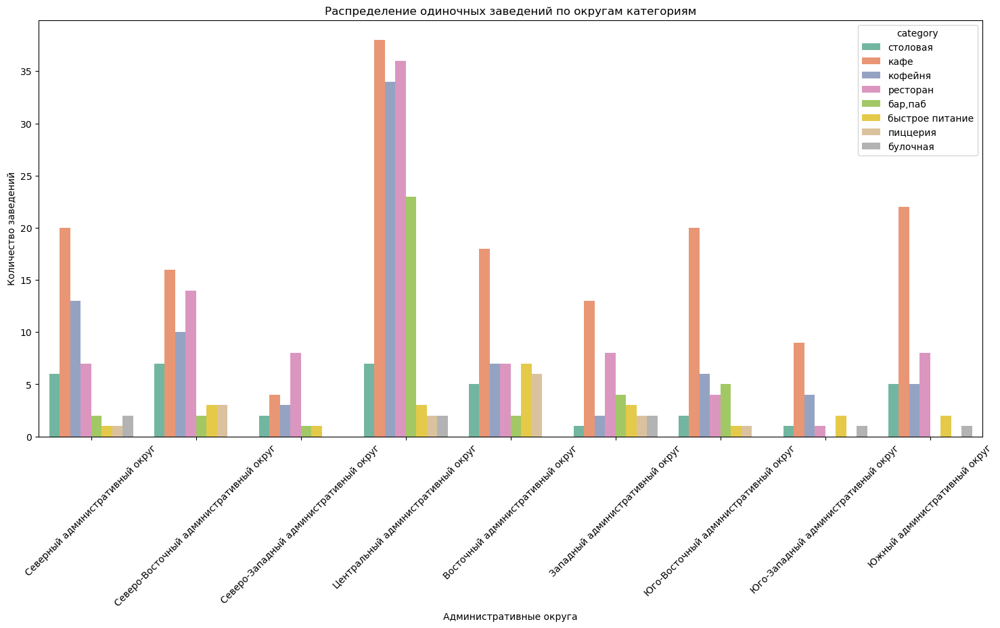

In [57]:
sns.set_palette('Set2')
plt.figure(figsize=(18, 8))
sns.countplot(data =str_one_cnt,  x='district', hue='category')
plt.title('Распределение одиночных заведений по округам категориям')
plt.xlabel('Административные округа')
plt.ylabel('Количество заведений')
plt.xticks(rotation=45)
plt.show()

Посмотрим в каких округах они находятся и их рейтинг.

In [58]:
# создадим таблицу
str_rat = str_one_cnt.pivot_table(index='district', values='rating', aggfunc='mean')\
.sort_values(by='rating', ascending=False).reset_index()

In [59]:
# создаём карту Москвы
msc = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=str_rat,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='RdPu',
    fill_opacity=0.8,
    legend_name='Рейтинг по округам для заведений являющимися единственными на улице',
).add_to(msc)

# выводим карту
msc

In [60]:
# построим соотношение заведений по категорям

str_cnt= str_one_cnt.pivot_table(index= 'category', values='name', aggfunc = 'count').sort_values(by='name')
str_cnt.columns = ['count']

fig = go.Figure()
fig.add_trace(go.Pie(values=str_cnt['count'], labels=str_cnt.index, hole=0.9))
fig.update_layout(autosize=False,
    width=900,
    height=400,
    title='Соотношение одиночных заведений по категорям')  
fig.show()

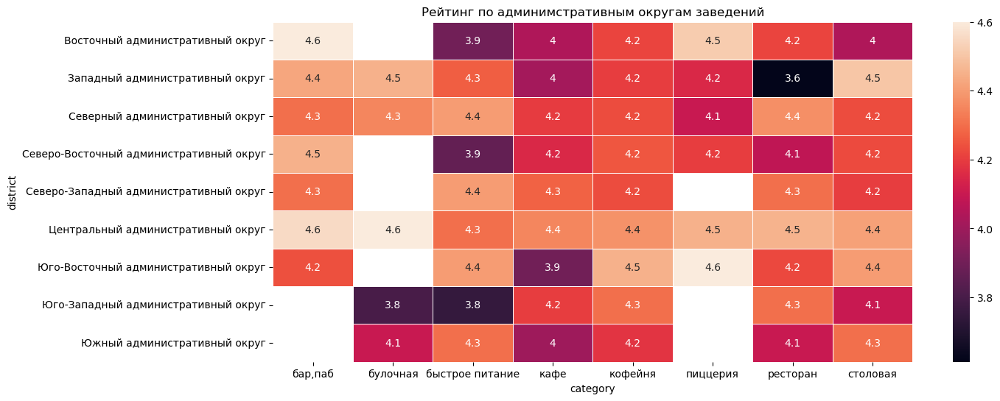

In [61]:
# построим тепловую карту по округам и рейтингу заведений
rating = str_one_cnt.pivot_table(index='district', columns='category', values='rating', aggfunc='mean')
plt.figure(figsize=(14,6))
plt.title("Рейтинг по админимстративным округам заведений")
sns.heatmap(rating, annot=True, linewidth=.5)
plt.show()

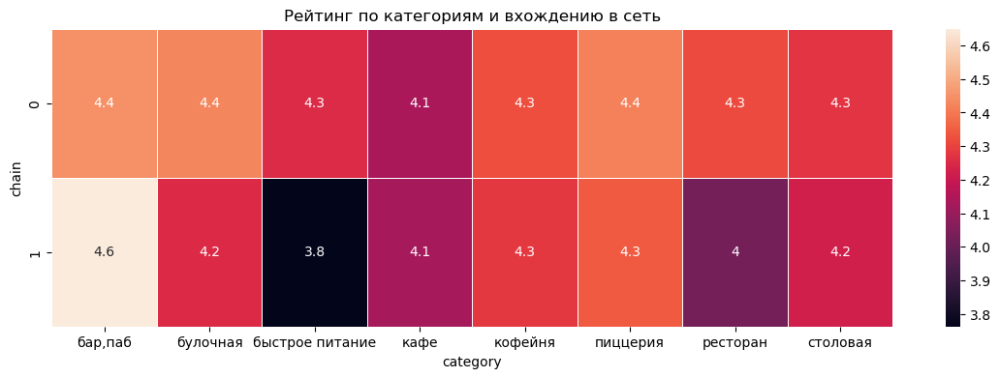

In [62]:
# построим тепловую карту по рейтингу заведений и присутствия в сети
rating = str_one_cnt.pivot_table(index='chain', columns='category', values='rating', aggfunc='mean')
plt.figure(figsize=(14,4))
plt.title("Рейтинг по категориям и вхождению в сеть")
sns.heatmap(rating, annot=True, linewidth=.5)
plt.show()

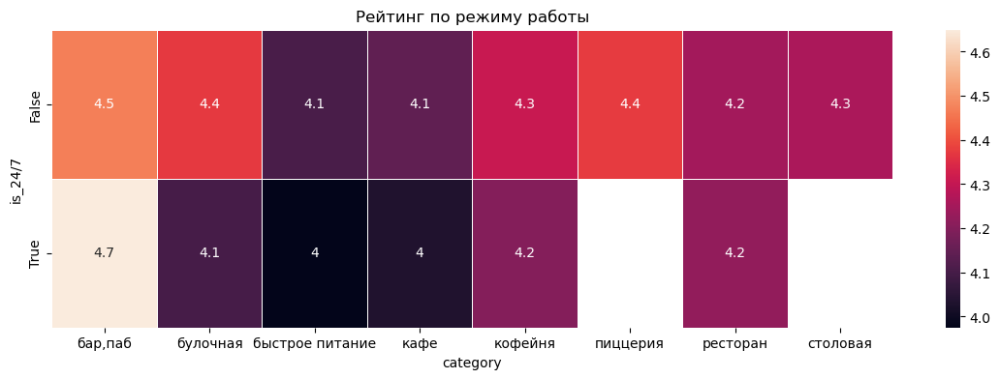

In [63]:
# построим тепловую карту по рейтингу заведений и режиму работы
rating = str_one_cnt.pivot_table(index='is_24/7', columns='category', values='rating', aggfunc='mean')
plt.figure(figsize=(14,4))
plt.title("Рейтинг по режиму работы")
sns.heatmap(rating, annot=True, linewidth=.5)
plt.show()

*Комментарий*

Всего таких улиц 458.

В Центральном округе рейтин заведений самый высокий, где на улице присутствует только один объект общепита. В некоторый округах отсутствует рейтинг определенных категорий и в целом рейтинг заведений высокий. Можно предположить, что из-за отсутствия сильной конкуренции на этих улицах можно открыть заведение и это будет выгодно вплане показателей рейтинга. 

Если рассматривать с позиции явлется ли сетивым заведение, то тут лидируют бары и пабы, худший показатель рейтинга в категории быстрое питание. Конкуренция у сетевых баров и пабов высокая. Рейтинг несетевых заведений примерно равен во всех категориях от 4.1 до 4.4.


Рейтинг не круглосуточных заведений от 4.1 до 4.5. В круглосуточных лидирует бар и паб с рейтингом 4.7. Предположим, что отсутствие рейтинга у пиццерии и столовой, говорит о том, что таких заведений нет на этих улицах.

### Посчитаем медиану столбца middle_avg_bill для каждого района. 

In [64]:
median_mab = df.groupby('district', as_index=False)['middle_avg_bill'].agg('median')
median_mab

,district,middle_avg_bill
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [65]:
# создаём карту Москвы
msc = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=median_mab,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='RdPu',
    fill_opacity=0.8,
    legend_name='Медианная стоимость заказа по административным округам',
).add_to(msc)

# выводим карту
msc

*Комментарий*

Самый высокий чек в двух округах около 1000р.: Центральном и Западном. В ЦАО множество туристических точек притяжения, в целом высокая стоимость аренды. А в Западном округе близость Рублёвского шоссе и прочих дорогих локаций, которые также приводят к высокой стоимости аренды. Далее стоимость в других округах идет на понижение: примерно 700р. Северо-Западный округ и Северный округ, около 600р. Юго-Западный и Восточный округ, примерно 500р. в Южном, Юго-Восточном и Северо-Восточном округах. 

В целом удаленность от Центрального округа снижает средний чек, но не для Западного округа.

### Вывод.

- В данных за 2022 год с заведениями общественного питания Москвы, выявила 8 категорий заведений общественного питания. 
- Кафе - 2378, ресторанов - 2043, кофейни - 1413, бары и пабы - 765, пиццерии - 633, быстрое питание - 603, столовые - 315, булочные - 256. Явные лидеры по количеству заведений в Москве: кафе, рестораны и кофейни.
- Посадочные места в сетевых заведениях привалируют над не сетевыми. Наибольшее количество посадочных мест в Западном, Центральном, Южном округе.
- Соотношение сетевых заведений 38.1% и не сетевых заведнеий 61.9%
- В топ-15 популярных сетей входят довольно известные и находящие на слуху сети, лидирует Шоколадница, Домино'с Пицца, Додо Пицца.
- Центральный округ является лидирующим по количеству ресторанов, кафе, кофейнь, баров и пабов. 
- Меньше всего заведений всех категорий представлены в Северо-Восточном округе.
- Средний рейтинг заведений по категориям не сильно отличается друг от друга.
- Наилучший рейтинг у заведений находящихся в Северо-Восточном округе, самый низкий рейтинг в Восточном округе. 
- Большенство заведений расположены на улице Проспект Мира, Профсоюзная, проспект Вернадского и Ленинском проспекте.
- Рестораны преобладают: проспект Мира, Ленинский проспект, проспект Вернадского, Профсоюзная улица и Ленинградское шоссе.
- Кафе: проспект Мира, МКАД, Профсоюзная улица, Ленинский проспект, Люблинская улица.
- Кофейни: проспект Мира, Ленинградский проспект и Ленинский проспект.
- На 458 улицах расположено всего по одному зведению. В Центральном округе рейтинг этих заведений самый высокий. В сетевых заведениях лидируют бары и пабы, худший показатель рейтинга в категории быстрое питание. Рейтинг не сетевых заведений примерно равен во всех категориях от 4.1 до 4.4.
- Самый высокий средний чек в двух округах, около 1000р. в Центральном и Западном. Далее стоимость в других округах идет на понижение: примерно 700р. Северо-Западный округ и Северный округ, около 600р. Юго-Западный и Восточный округ, примерно 500р. в Южном, Юго-Восточном и Северо-Восточном округах. В целом удаленность от Центрального округа снижает средний чек.


## Исследуем открытие кофейни.

Клиент мечтает открыть кофейню в Москве. Заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуем определить, осуществима ли мечта клиентов.

### Найдем количество кофеен, посмотрим сколько их по округам.

In [66]:
coffee_cnt = df[df['category'] == 'кофейня']
print('Всего кофеен в городе', coffee_cnt.shape[0])

Всего кофеен в городе 1413


In [67]:
# найдем количество кофеен по округам
coffee_dis = df.query('category == "кофейня"')\
.pivot_table(index='district', values='category', aggfunc='count').sort_values(by='category', ascending=False).reset_index()

In [68]:
coffee_dis

,district,category
0,Центральный административный округ,428
1,Северный административный округ,193
2,Северо-Восточный административный округ,159
3,Западный административный округ,150
4,Южный административный округ,131
5,Восточный административный округ,105
6,Юго-Западный административный округ,96
7,Юго-Восточный административный округ,89
8,Северо-Западный административный округ,62


In [69]:
# постоим график распределения кофеен по округам
fig = go.Figure(data=[go.Bar(x = coffee_dis['district'], y = coffee_dis['category'])])
fig.update_layout(
                  title="Распределение кофеен по округам",
                  xaxis_title="Административные округа",
                  yaxis_title="Колличество кофеен",
                  height=600,
                  width=1000)
fig.show()

In [70]:
# создаём карту Москвы
msc = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_dis,
    columns=['district', 'category'],
    key_on='feature.name',
    fill_color='RdPu',
    fill_opacity=0.8,
    legend_name='Расположение кофеен по округам',
).add_to(msc)

# выводим карту
msc

*Комментарий*

Всего кофеен в городе 1413.

В Центральном административном округе расположено бошее количество кофеен - 428. В Северо-Западном округе их менеевсего - 62 заведения. 

### Посмотрим есть ли круглосуточные кофейни и где они расположены.

In [71]:
# есть ли круглосуточные кофейни

print('Круглосуточных кофеен в городе', coffee_cnt['is_24/7'].sum())

Круглосуточных кофеен в городе 59


In [72]:
coffee_24 = coffee_cnt.pivot_table(index='district', values = 'is_24/7', aggfunc='sum')\
.sort_values(by='is_24/7', ascending=False).reset_index()

In [73]:
coffee_24

,district,is_24/7
0,Центральный административный округ,26
1,Западный административный округ,9
2,Юго-Западный административный округ,7
3,Восточный административный округ,5
4,Северный административный округ,5
5,Северо-Восточный административный округ,3
6,Северо-Западный административный округ,2
7,Юго-Восточный административный округ,1
8,Южный административный округ,1


In [74]:
# посмотрим расположение круглосуточных кофеен по округам
fig = go.Figure(data=[go.Bar(x = coffee_24['district'], y = coffee_24['is_24/7'])])
fig.update_layout(
                  title="Расположение круглосуточных кофеен по округам",
                  xaxis_title="Административные округа",
                  yaxis_title="Колличество кофеен",
                  height=500,
                  width=1000)
fig.show()

*Комментарий*

По прежнему лидирует Центральный округ, 26 круглосуточных кофеен. По одной круглосуточной кофейни в Южном и Юго-Восточном округах.

### Посмотрим рейтинг кофеен.

In [75]:
# Посмотрм рейтинги кофеен, есть ли разница в медиане и среднем
coffee_cnt['rating'].describe()

count    1413.000000
mean        4.277282
std         0.372250
min         1.400000
25%         4.100000
50%         4.300000
75%         4.400000
max         5.000000
Name: rating, dtype: float64

*Комментарий*

Медиальное и среднее значение рейтинга кофеен практически одинаково - 4.3.

In [76]:
# найдем рейтинг кофеен по округам
coffee_rating = coffee_cnt.pivot_table(index='district', values='rating', aggfunc='mean').sort_values(by='rating', ascending=False).reset_index()

In [77]:
# посмотрим рейтинг кофеен по округам
# создаём карту Москвы
msc = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='RdPu',
    fill_opacity=0.8,
    legend_name='Рейтинг кофеен по округам',
).add_to(msc)

# выводим карту
msc

*Комментарий*

Высокие показатели рейтинга в Центральном и Северо-Западном округе - 4.34. Чуть ниже рейтинг в Свеверном округе - 4.31. Западный и Свеверо восточный делят последнее место с рейтингом - 4.2

### Посмотрим стоимость чашки капучино.

In [78]:
# посмотрм стоимость чашки кофе, есть ли разница в медиане и среднем
coffee_cnt['middle_coffee_cup'].describe()

count     521.000000
mean      175.055662
std        89.753009
min        60.000000
25%       124.000000
50%       170.000000
75%       225.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

*Комментарий*

Медиана и среднее имеют не большое различие.
Стоимость чашки капупино варьируется от 170 до 175 р.

In [79]:
coffee_cup = coffee_cnt.groupby('district', as_index=False)['middle_coffee_cup'].agg('mean')
coffee_cup

,district,middle_coffee_cup
0,Восточный административный округ,174.023810
1,Западный административный округ,189.938776
2,Северный административный округ,165.789474
3,Северо-Восточный административный округ,165.333333
4,Северо-Западный административный округ,165.523810
5,Центральный административный округ,187.518519
6,Юго-Восточный административный округ,151.088235
7,Юго-Западный административный округ,184.176471
8,Южный административный округ,158.488372


In [80]:
# посмотрим стоимость чашки капучино по округам
# создаём карту Москвы
msc = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_cup,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='RdPu',
    fill_opacity=0.8,
    legend_name='Медианная стоимость заказа по административным округам',
).add_to(msc)

# выводим карту
msc

*Комментарий*

В среднем около 190 р. за капучино посетитель заплатит в Центральном, Западном и Юго-Западном округе. Самая дешевовая чашка капучино - около 150 р. в Юго-Восточном округе. 

### Посмотрим на топ-10 улиц с кофейнями.

In [81]:
coff_str = coffee_cnt.pivot_table(index='street', values='name', aggfunc = 'count').sort_values(by='name', ascending=False).head(10)
coff_str.columns = ['count']

In [82]:
coff_str_bar = coff_str.reset_index()

In [83]:
fig = go.Figure(data=[go.Bar(x = coff_str_bar['street'], y = coff_str_bar['count'])])
fig.update_layout(
                  title="Распределение кофеен по улицам топ-10",
                  xaxis_title="Улицы Москвы",
                  yaxis_title="Колличество кофеен",
                  height=400,
                  width=1000)
fig.show()

In [84]:
coffee10 = coff_str.index

In [85]:
coffee_str = coffee_cnt.query('street in @coffee10')

In [86]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
msc = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(msc)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
coffee_str.apply(create_clusters, axis=1)

# выводим карту
msc

### Рекомендация.

Предлагаю рассмотреть открытие кофейни в Центральном или Северо-Западном округе.

Если заказчики не бояться конкуренции можно расмотреть Центральный округ. Не смотря на высокую конкуренцию, мы видим высокие рейтинги заведений, средний чек за чашку копучино около 190 р. Проходимость и спрос в центре города высокий - в этом плане идеальное расположение. Нет смысла открывать круглосуточную кофейню, их довольно мало в целом.

Так же можно рассмотреть Северо-Западный округ. Рейтинг кофеен по округу сопоставим с Центральным, но по количеству заведений будет меньше конкуренции. Стоимость чашки капучино должна быть примерно в районе 170 р., эта цена не будет выбиваться из ценового диапазона этого округа. 

###  Презентация

https://drive.google.com/file/d/1wMjCGgaAQ9B7W7L7AoUDMfGmWxrRDSpA/view?usp=sharing